### ANTES DE INICIAR SIGA O PASSO ABAIXO
- Faça o download da base de dados no link a seguir e salve na pasta "dataset" dentro do projeto antes de executar qualquer ação: https://www.kaggle.com/allanbruno/airbnb-rio-de-janeiro

### Importar Bibliotecas e Bases de Dados / Consolidar Base de Dados

In [1]:
#importar bibliotecas
import pandas as pd
import pathlib
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor
from sklearn.model_selection import train_test_split

In [2]:
#criar um dicionario dos meses para referencia na tabela consolidada
meses = {'jan': 1, 'fev': 2, 'mar': 3, 'abr': 4, 'mai': 5, 'jun': 6, 'jul': 7, 'ago': 8, 'set': 9, 'out': 10, 'nov': 11, 'dez': 12}

#importar base de dados e consolidar todas em uma (adicionando a coluna mes e ano conforme nome do arquivo)
caminho_bases = pathlib.Path('dataset')
base_airbnb = pd.DataFrame()

for arquivo in caminho_bases.iterdir():
    mes = meses[arquivo.name[:3]]
    
    ano = arquivo.name[-8:]
    ano = int(ano.replace('.csv', ''))
    
    df = pd.read_csv(caminho_bases / arquivo.name)
    df['ano'] = ano
    df['mes'] = mes
    base_airbnb = pd.concat([base_airbnb, df], ignore_index=True)

display(base_airbnb)

C:\Users\kaaua\AppData\Local\Temp\ipykernel_5532\2785831654.py:14: DtypeWarning: Columns (62,87) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(caminho_bases / arquivo.name)
C:\Users\kaaua\AppData\Local\Temp\ipykernel_5532\2785831654.py:14: DtypeWarning: Columns (61,62,94) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(caminho_bases / arquivo.name)
C:\Users\kaaua\AppData\Local\Temp\ipykernel_5532\2785831654.py:14: DtypeWarning: Columns (61,62,94) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(caminho_bases / arquivo.name)
C:\Users\kaaua\AppData\Local\Temp\ipykernel_5532\2785831654.py:14: DtypeWarning: Columns (87) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(caminho_bases / arquivo.name)
C:\Users\kaaua\AppData\Local\Temp\ipykernel_5532\2785831654.py:14: DtypeWarning: Columns (61,62,94) have mixed types.

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,number_of_reviews_ltm,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms
0,14063,https://www.airbnb.com/rooms/14063,20180414160018,2018-04-14,Living in a Postcard,"Besides the most iconic's view, our apartment ...",NaN,"Besides the most iconic's view, our apartment ...",none,Best and favorite neighborhood of Rio. Perfect...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,17878,https://www.airbnb.com/rooms/17878,20180414160018,2018-04-14,Very Nice 2Br - Copacabana - WiFi,Please note that special rates apply for New Y...,- large balcony which looks out on pedestrian ...,Please note that special rates apply for New Y...,none,This is the best spot in Rio. Everything happe...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,24480,https://www.airbnb.com/rooms/24480,20180414160018,2018-04-14,Nice and cozy near Ipanema Beach,My studio is located in the best of Ipanema. ...,The studio is located at Vinicius de Moraes St...,My studio is located in the best of Ipanema. ...,none,"The beach, the lagoon, Ipanema is a great loca...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,25026,https://www.airbnb.com/rooms/25026,20180414160018,2018-04-14,Beautiful Modern Decorated Studio in Copa,"Our apartment is a little gem, everyone loves ...",This newly renovated studio (last renovations ...,"Our apartment is a little gem, everyone loves ...",none,Copacabana is a lively neighborhood and the ap...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,31560,https://www.airbnb.com/rooms/31560,20180414160018,2018-04-14,NICE & COZY 1BDR - IPANEMA BEACH,This nice and clean 1 bedroom apartment is loc...,This nice and clean 1 bedroom apartment is loc...,This nice and clean 1 bedroom apartment is loc...,none,Die Nachbarschaft von Ipanema ist super lebend...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
902205,38844730,https://www.airbnb.com/rooms/38844730,20190923212307,2019-09-24,TRANSAMERICA BARRA DA TIJUCA R IV,"Em estilo contemporâneo, o Transamerica Prime ...",NaN,"Em estilo contemporâneo, o Transamerica Prime ...",none,NaN,...,1.0,1.0,1125.0,1125.0,1.0,1125.0,0.0,15.0,0.0,0.0
902206,38846408,https://www.airbnb.com/rooms/38846408,20190923212307,2019-09-24,Alugo para o Rock in Rio,"Confortável apartamento, 2 quartos , sendo 1 s...",O apartamento estará com mobília completa disp...,"Confortável apartamento, 2 quartos , sendo 1 s...",none,"Muito próximo ao Parque Olímpico, local do eve...",...,2.0,2.0,1125.0,1125.0,2.0,1125.0,0.0,1.0,0.0,0.0
902207,38846703,https://www.airbnb.com/rooms/38846703,20190923212307,2019-09-24,Apt COMPLETO em COPACABANA c/TOTAL SEGURANÇA,Apartamento quarto e sala COMPLETO para curtas...,Espaço ideal para até 5 pessoas. Cama de casal...,Apartamento quarto e sala COMPLETO para curtas...,none,NaN,...,3.0,3.0,1125.0,1125.0,3.0,1125.0,0.0,23.0,6.0,0.0
902208,38847050,https://www.airbnb.com/rooms/38847050,20190923212307,2019-09-24,Cobertura Cinematografica,Cobertura alto nivel,NaN,Cobertura alto nivel,none,NaN,...,1.0,1.0,1125.0,1125.0,1.0,1125.0,0.0,1.0,0.0,0.0


### Se tivermos muitas colunas, já vamos identificar quais colunas podemos excluir

- Como temos muitas colunas, nosso modelo pode acabar ficando muito lento, além disso, uma análise rápida permite verificar que varias colunas não são necessárias para o nosso modelo de previsão, portanto, vamos excluir algumas colunas da nossa base de dados.

- Tipos de colunas que vamos excluir:
    1. IDs, Links e Informações não relevantes para o modelo.
    2. Colunas repetidas ou extremamente parecidas com outra (Exemplo: DATA x ANO/MES).
    3. Colunas preenchidas com texto livre (não rodaremos nenhuma análise de palavras). 
    4. Colunas em que todos ou quase todos os valores estão vazios.


- para isso, vamos criar um arquivo excel com os 1000 primeiros registros e fazer uma análise qualitativa. 

In [3]:
#verificar todas as colunas
print(list(base_airbnb.columns))

#exportar excel com 1000 primeiros registros, para análise
base_airbnb.head(1000).to_csv('primeiros_registros.csv', sep=';')

['id', 'listing_url', 'scrape_id', 'last_scraped', 'name', 'summary', 'space', 'description', 'experiences_offered', 'neighborhood_overview', 'notes', 'transit', 'access', 'interaction', 'house_rules', 'thumbnail_url', 'medium_url', 'picture_url', 'xl_picture_url', 'host_id', 'host_url', 'host_name', 'host_since', 'host_location', 'host_about', 'host_response_time', 'host_response_rate', 'host_acceptance_rate', 'host_is_superhost', 'host_thumbnail_url', 'host_picture_url', 'host_neighbourhood', 'host_listings_count', 'host_total_listings_count', 'host_verifications', 'host_has_profile_pic', 'host_identity_verified', 'street', 'neighbourhood', 'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'city', 'state', 'zipcode', 'market', 'smart_location', 'country_code', 'country', 'latitude', 'longitude', 'is_location_exact', 'property_type', 'room_type', 'accommodates', 'bathrooms', 'bedrooms', 'beds', 'bed_type', 'amenities', 'square_feet', 'price', 'weekly_price', 'monthly_price', '

In [4]:
#verificar os valores da coluna 'host_identity_verified'
print(base_airbnb['host_identity_verified'].value_counts())

host_identity_verified
f    638505
t    263245
Name: count, dtype: int64


In [5]:
#comparação entre duas colunas e depois verificar quantidade de True e False
print((base_airbnb['host_listings_count']==base_airbnb['host_total_listings_count']).value_counts())

True     901750
False       460
Name: count, dtype: int64


In [6]:
#verificar quantos são nulos na coluna 'number_of_reviews'
print(base_airbnb['number_of_reviews'].isnull().value_counts())

number_of_reviews
False    902210
Name: count, dtype: int64


### Depois da análise qualitativa das colunas, levando em conta os critérios explicados acima, ficamos com as seguintes colunas:

In [7]:
colunas = ['host_is_superhost','host_listings_count','host_identity_verified','latitude','longitude','property_type','room_type','accommodates','bathrooms','bedrooms','beds','bed_type','amenities','price','security_deposit','cleaning_fee','guests_included','extra_people','minimum_nights','number_of_reviews','review_scores_rating','review_scores_accuracy','review_scores_cleanliness','review_scores_checkin','review_scores_communication','review_scores_location','review_scores_value','instant_bookable','is_business_travel_ready','cancellation_policy','ano','mes'
]

#iremos filtrar nossa base de dados original e ficar apenas com as colunas acima.

base_airbnb = base_airbnb.loc[:, colunas]
display(base_airbnb)

,host_is_superhost,host_listings_count,host_identity_verified,latitude,longitude,property_type,room_type,accommodates,bathrooms,bedrooms,...,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,is_business_travel_ready,cancellation_policy,ano,mes
0,f,1.0,t,-22.946854,-43.182737,Apartment,Entire home/apt,4,1.0,0.0,...,9.0,9.0,9.0,9.0,9.0,f,f,strict_14_with_grace_period,2018,4
1,t,2.0,f,-22.965919,-43.178962,Condominium,Entire home/apt,5,1.0,2.0,...,9.0,10.0,10.0,9.0,9.0,t,f,strict,2018,4
2,f,1.0,t,-22.985698,-43.201935,Apartment,Entire home/apt,2,1.0,1.0,...,10.0,10.0,10.0,10.0,9.0,f,f,strict,2018,4
3,f,3.0,t,-22.977117,-43.190454,Apartment,Entire home/apt,3,1.0,1.0,...,10.0,10.0,10.0,10.0,9.0,f,f,strict,2018,4
4,t,1.0,t,-22.983024,-43.214270,Apartment,Entire home/apt,3,1.0,1.0,...,10.0,10.0,10.0,10.0,9.0,t,f,strict,2018,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
902205,f,0.0,f,-23.003180,-43.342840,Apartment,Entire home/apt,4,1.0,0.0,...,NaN,NaN,NaN,NaN,NaN,f,f,flexible,2019,9
902206,f,0.0,f,-22.966640,-43.393450,Apartment,Entire home/apt,4,2.0,2.0,...,NaN,NaN,NaN,NaN,NaN,f,f,flexible,2019,9
902207,f,32.0,t,-22.962080,-43.175520,Apartment,Entire home/apt,5,1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,f,f,strict_14_with_grace_period,2019,9
902208,f,0.0,t,-23.003400,-43.341820,Apartment,Entire home/apt,4,1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,f,f,strict_14_with_grace_period,2019,9


### Tratar Valores Faltando
- resultados NaN irá inviabilizar nosso modelo de previsão, portanto, iremos tratar esses resultados abaixo.

- Ao análisar os dados, percebemos que existe uma grande disparidade em dados faltantes. As colunas com mais de 300.000 dados NaN foram excluídas.
- Para as demais colunas com valores NaN, vamos excluir as linhas pois não vai afetar na nossa base de dados, por ela ser grande.

In [8]:
#deletar as colunas com mais de 300.000 resultados NaN
for coluna in base_airbnb:
    if base_airbnb[coluna].isnull().sum() > 300000:
        base_airbnb = base_airbnb.drop(coluna, axis=1)

#deletar as linhas com resultados NaN
base_airbnb = base_airbnb.dropna()

print(base_airbnb.isnull().sum())
print(base_airbnb.shape)

host_is_superhost           0
host_listings_count         0
host_identity_verified      0
latitude                    0
longitude                   0
property_type               0
room_type                   0
accommodates                0
bathrooms                   0
bedrooms                    0
beds                        0
bed_type                    0
amenities                   0
price                       0
guests_included             0
extra_people                0
minimum_nights              0
number_of_reviews           0
instant_bookable            0
is_business_travel_ready    0
cancellation_policy         0
ano                         0
mes                         0
dtype: int64
(897709, 23)


### Verificar Tipos de Dados em cada coluna

In [9]:
print(base_airbnb.dtypes)
print('-'*60)
print(base_airbnb.iloc[0])

host_is_superhost            object
host_listings_count         float64
host_identity_verified       object
latitude                    float64
longitude                   float64
property_type                object
room_type                    object
accommodates                  int64
bathrooms                   float64
bedrooms                    float64
beds                        float64
bed_type                     object
amenities                    object
price                        object
guests_included               int64
extra_people                 object
minimum_nights                int64
number_of_reviews             int64
instant_bookable             object
is_business_travel_ready     object
cancellation_policy          object
ano                           int64
mes                           int64
dtype: object
------------------------------------------------------------
host_is_superhost                                                           f
host_listings_count

- Ao analisar os dados acima, percebe-se que as colunas PRICE e EXTRA_PEOPLE estão com os dados como Object porém são Float, pois são valores e não informações de texto.

- Antes de transformar em Float, é necessario retirar o $ e também retirar o separador de milhar.

In [10]:
#Tratamento Price
base_airbnb['price'] = base_airbnb['price'].str.replace('$', '').str.replace(',', '').astype(np.float32, copy=False)

#Tratamento Extra People
base_airbnb['extra_people'] = base_airbnb['extra_people'].str.replace('$', '').str.replace(',', '').astype(np.float32, copy=False)

#verificando novamente os dados
print(base_airbnb.dtypes)

host_is_superhost            object
host_listings_count         float64
host_identity_verified       object
latitude                    float64
longitude                   float64
property_type                object
room_type                    object
accommodates                  int64
bathrooms                   float64
bedrooms                    float64
beds                        float64
bed_type                     object
amenities                    object
price                       float32
guests_included               int64
extra_people                float32
minimum_nights                int64
number_of_reviews             int64
instant_bookable             object
is_business_travel_ready     object
cancellation_policy          object
ano                           int64
mes                           int64
dtype: object


### Se você preferir pode transformar o resto dos dados em dtype32 ao inves de dtype64 para garantir um código mais rápido.

In [11]:
#irei agora transformar todas as outras colunas númericas em dtype32 ao invés de dtype64 pois pelo tamanho da base de dados, acredito que irá deixar menos lento.
for coluna in base_airbnb:
    if base_airbnb[coluna].dtype == 'float64':
        base_airbnb[coluna] = base_airbnb[coluna].astype(np.float32, copy=False)
    elif base_airbnb[coluna].dtype == 'int64':
        base_airbnb[coluna] = base_airbnb[coluna].astype(np.int32, copy=False)

print(base_airbnb.dtypes)

host_is_superhost            object
host_listings_count         float32
host_identity_verified       object
latitude                    float32
longitude                   float32
property_type                object
room_type                    object
accommodates                  int32
bathrooms                   float32
bedrooms                    float32
beds                        float32
bed_type                     object
amenities                    object
price                       float32
guests_included               int32
extra_people                float32
minimum_nights                int32
number_of_reviews             int32
instant_bookable             object
is_business_travel_ready     object
cancellation_policy          object
ano                           int32
mes                           int32
dtype: object


### Análise Exploratória e Tratar Outliers

- Vamos basicamente olhar feature por feature (coluna por coluna) para:
    1. Ver a correlação entre as features e decidir se manteremos todas as features que temos.
    2. Excluir outliers (usaremos como regra, valores abaixo de Q1 - 1.5x Amplitude e valores acima de Q3 + 1.5x Amplitude). Amplitude = Q3 - Q1
    3. Confirmar se todas as features que temos fazem realmente sentido para o nosso modelo ou se alguma delas não vai nos ajudar e se devemos excluir
    
- Vamos começar pelas colunas de preço (resultado final que queremos) e de extra_people (também valor monetário). Esses são os valores numéricos contínuos.

- Depois vamos analisar as colunas de valores numéricos discretos (accomodates, bedrooms, guests_included, etc.)

- Por fim, vamos avaliar as colunas de texto e definir quais categorias fazem sentido mantermos ou não.

<Axes: >

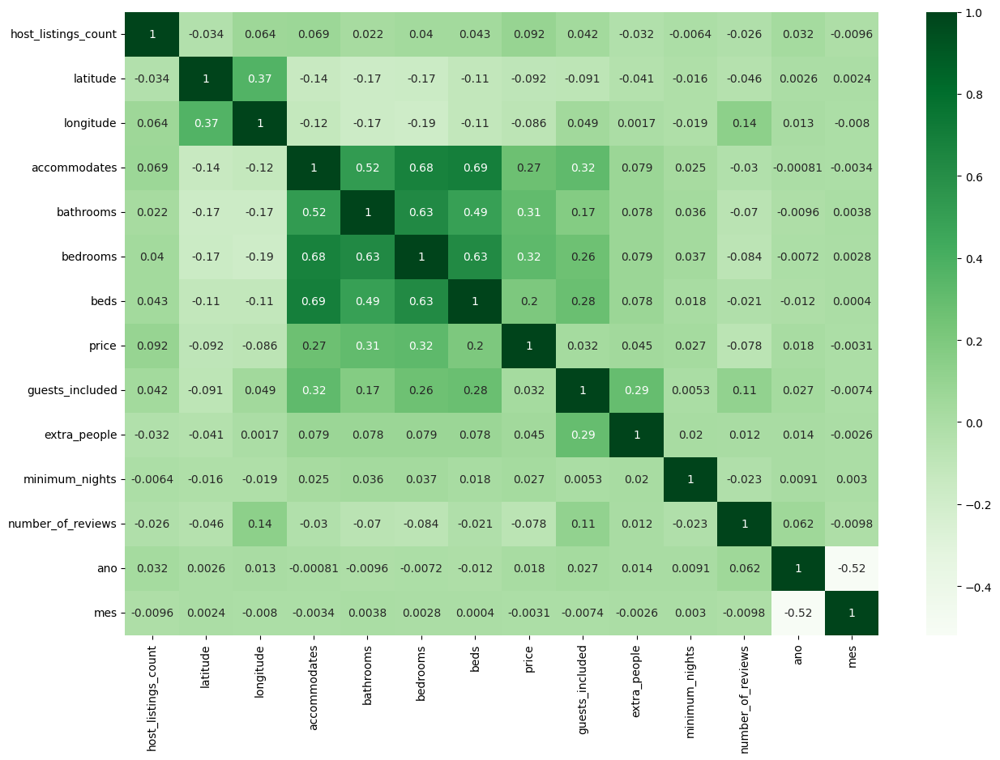

In [12]:
#para fazer correlação preciso calcular apenas as colunas que são numeros, portanto, irei filtrar-las.
base_airbnb_corr = base_airbnb.select_dtypes(include=['number'])

#Verificar a correlação entre as features e decidir se manteremos todas as features que temos.
plt.figure(figsize=(15, 10))
sns.heatmap(base_airbnb_corr.corr(), annot=True, cmap='Greens')

### Vamos definir as funções para análise de Outliers que serão feita em todas as colunas.
- Função para definir os limites e exclusão de outliers.
- Função para definir os gráficos de análise.

In [13]:
# A primeira função será a de limites, que precisa calcular o primeiro quartil, o terceiro quartil, a amplitude e os limites inferior e superior.
def limites(coluna):
    q1 = coluna.quantile(0.25)
    q3 = coluna.quantile(0.75)
    amplitude = q3 - q1
    return q1 - 1.5 * amplitude, q3 + 1.5 * amplitude

# Vamos definir a função para retirar Outliers
def excluir_outliers(df, nome_coluna):
    qtde_linhas = df.shape[0]
    lim_inf, lim_sup = limites(df[nome_coluna])
    df = df.loc[(df[nome_coluna] >= lim_inf) & (df[nome_coluna] <= lim_sup), :]
    return df, qtde_linhas - df.shape[0]

# Vamos definir as funções para diagrama de caixa, histograma e barras.
def diagrama_caixa(coluna):
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(15, 5)
    sns.boxplot(x=coluna, ax=ax1)
    ax2.set_xlim(limites(coluna))
    sns.boxplot(x=coluna, ax=ax2)

def histograma(coluna):
    plt.figure(figsize=(15, 5))
    sns.histplot(coluna, kde=True)

def grafico_barra(coluna):
    plt.figure(figsize=(15, 5))
    contagem = coluna.value_counts()
    ax = sns.barplot(x=contagem.index, y=contagem.values)
    ax.set_xlim(limites(coluna))



### Resumo sobre Outliers das colunas numéricas conforme informações análisadas abaixo.

- Irei fazer um resumo de cada coluna númerica analisada abaixo, explicando o porque de deletar os Outliers ou a coluna inteira.
    1. price
        - Como não estamos construindo um modelo de previsão para imóveis de luxo, acredito que faz sentido retirar os valores que estão acima do limite superior, pois não agregaria para o nosso projeto. Por este motivo, iremos excluir esses Outliers.

    2. extra_people
         - Pelos mesmos motivos de análise da coluna 'price', vamos filtrar a coluna 'extra_people' para dentro da faixa limite, excluindo os Outliers.

    3. host_listings_count
         - O público-alvo do nosso projeto visa pessoas que provavelmente não tenham mais que seis imóveis que foi o limite superior definido, excluindo então gerenciadores de imóveis e imobiliárias. Por este motivo vamos deletar os Outliers.
           
    4. accommodates
         - Referente a coluna 'accommodates', também vamos excluir os Outliers pois imóveis com mais de 9 comodos estipulados pelo limite superior, provavelmente, não são "comuns".
      
    5. bathrooms
        - Temos como limite superior estipulado três banheiros, após isso seria Outlier. Nessa questão até poderia fazer sentido os valores acima do limite superior, porém, nossos resultados estão com mais de 80% dos valores dentro da faixa estipulada, portanto, irei deletar os Outliers para ajudar ao máximo o nosso modelo e não inviabilizar-lo.
          
    6. bedrooms
         - Referente a coluna 'bedrooms', acredito que temos dois problemas, a maioria dos resultados estão dentro da faixa estipulada, tornando os Outliers inviáveis e imóveis com muitos quartos provavelmente não é o que o nosso modelo precisa.

    7. beds
         - A coluna 'beds' segue o mesmo padrão de análise das duas colunas acima, portanto, irei retirar os Outliers.

    8. guests_included
         - Analisando a coluna 'guests_included', verificamos que o limite inferior e superior estão cravados em 1.0, acredito que esse campo é mal preenchido pelos hosts, portanto, não iremos excluir os Outliers da análise e sim a coluna inteira para evitar inviabilizar o modelo de previsão.
           
    9. minimum_nights
         - Iremos retirar os Outliers da coluna 'minimum_nights', pois queremos treinar o nosso modelo para pessoas que querem disponibilizar o seu imóvel para poucos dias e para maior rotatividade, excluindo alugueis de temporada ou de moradia.
  
    10. number_of_reviews
         - Não faria sentido retirar os Outliers da coluna 'number_of_reviews', acredito que a nota do host impacta diretamente no valor, porém, o nosso modelo seria para pessoas que querem disponibilizar o seu imóvel e não faria sentido para alguém está no seu primeiro aluguel e não tem review, inviabilizando o modelo, portanto, iremos retirar a coluna. 

### Análise 'price'

(np.float64(-524.0), np.float64(1276.0))


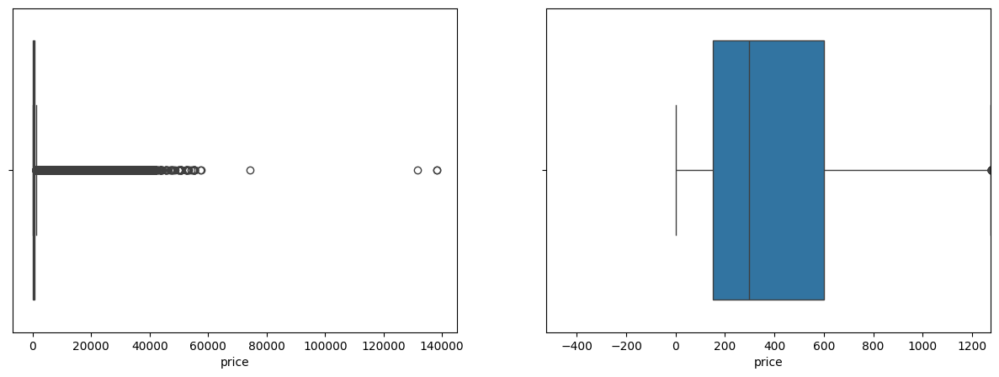

In [14]:
print(limites(base_airbnb['price']))
diagrama_caixa(base_airbnb['price'])

In [15]:
base_airbnb, linhas_removidas = excluir_outliers(base_airbnb, 'price')
print('{} linhas removidas.'.format(linhas_removidas))

87282 linhas removidas.


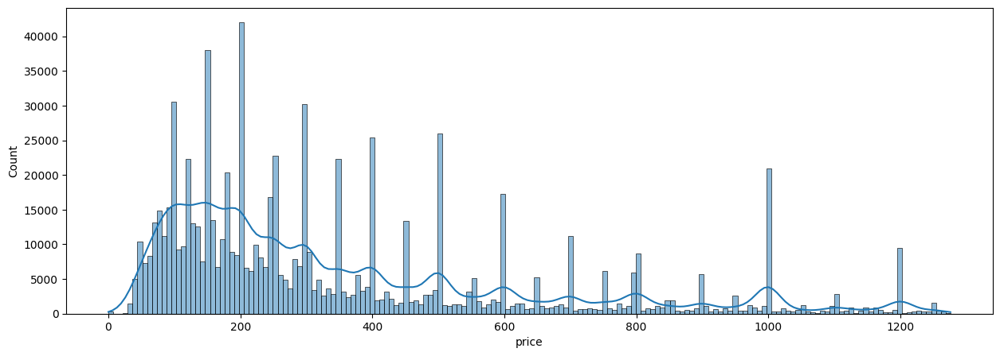

In [16]:
histograma(base_airbnb['price'])

### Análise 'extra_people'

(np.float64(-75.0), np.float64(125.0))


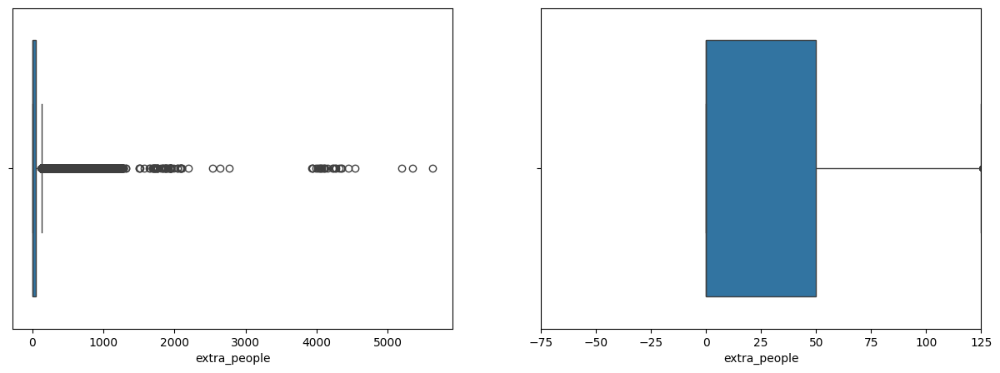

In [17]:
print(limites(base_airbnb['extra_people']))
diagrama_caixa(base_airbnb['extra_people'])

In [18]:
base_airbnb, linhas_removidas = excluir_outliers(base_airbnb, 'extra_people')
print('{} linhas removidas.'.format(linhas_removidas))

59194 linhas removidas.


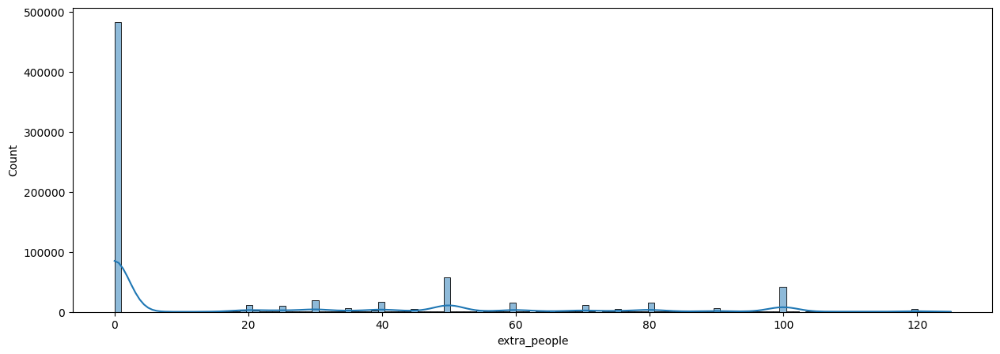

In [19]:
histograma(base_airbnb['extra_people'])

### Análise 'host_listings_count'

(np.float64(-2.0), np.float64(6.0))


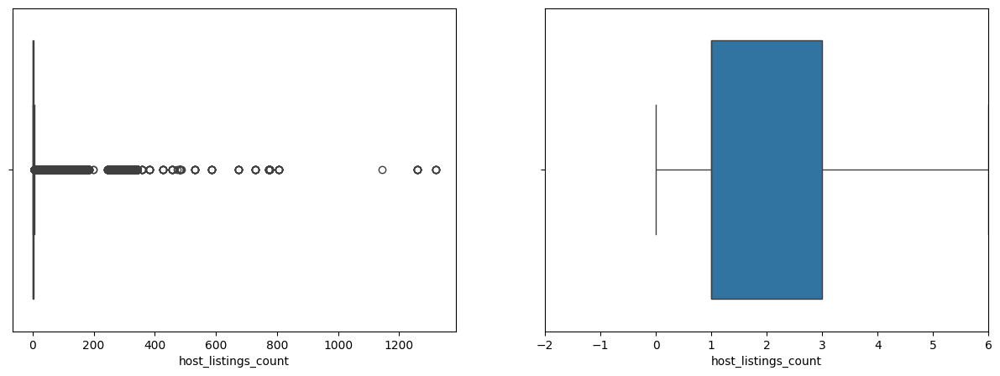

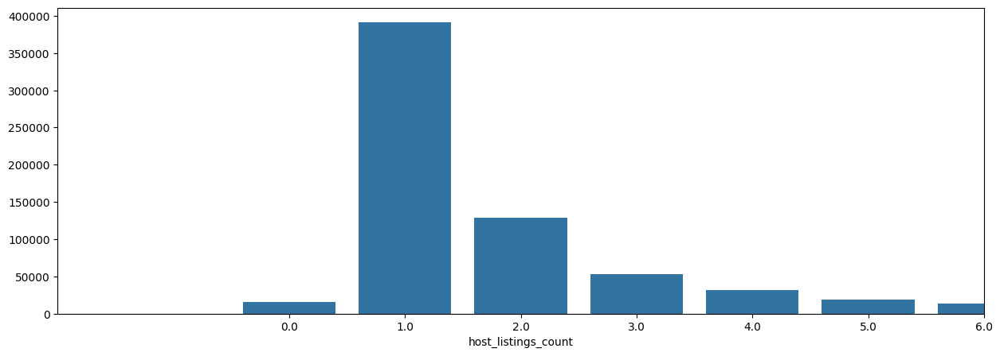

In [20]:
print(limites(base_airbnb['host_listings_count']))
diagrama_caixa(base_airbnb['host_listings_count'])
grafico_barra(base_airbnb['host_listings_count'])

In [21]:
base_airbnb, linhas_removidas = excluir_outliers(base_airbnb, 'host_listings_count')
print('{} linhas removidas.'.format(linhas_removidas))

97723 linhas removidas.


### Análise 'accommodates'

(np.float64(-2.5), np.float64(9.5))


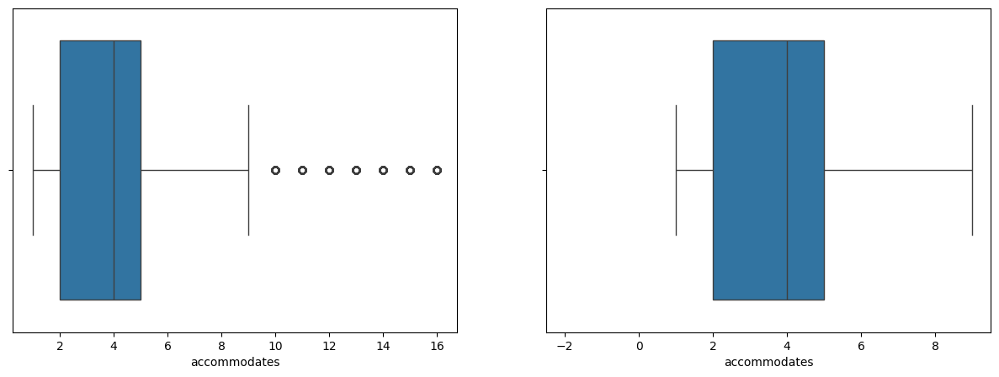

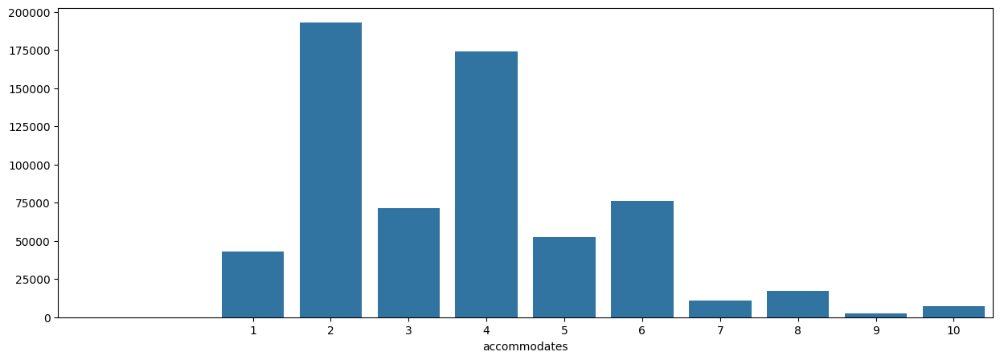

In [22]:
print(limites(base_airbnb['accommodates']))
diagrama_caixa(base_airbnb['accommodates'])
grafico_barra(base_airbnb['accommodates'])

In [23]:
# Utilizando a nossa função excluir_outliers, irei atualizar a nossa base de dados e verificar a quantidade de linhas deletadas.
base_airbnb, linhas_removidas = excluir_outliers(base_airbnb, 'accommodates')
print('{} linhas removidas.'.format(linhas_removidas))

13146 linhas removidas.


### Análise 'bathrooms' 

(np.float64(-0.5), np.float64(3.5))


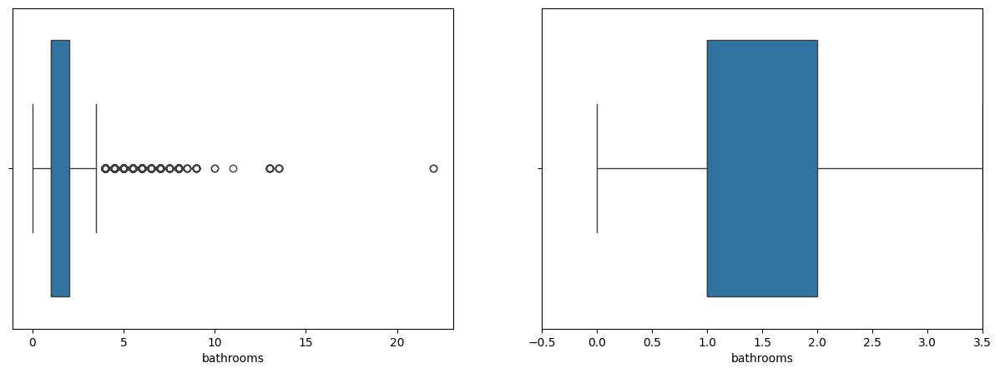

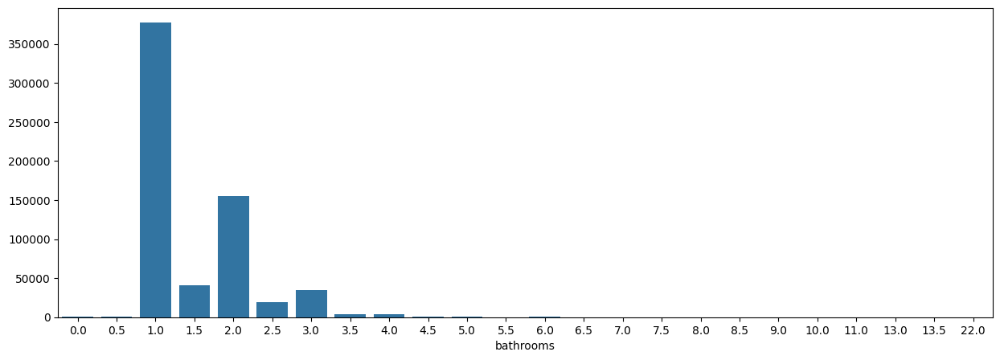

In [24]:
print(limites(base_airbnb['bathrooms']))
diagrama_caixa(base_airbnb['bathrooms'])

plt.figure(figsize=(15, 5))
contagem = base_airbnb['bathrooms'].value_counts()
ax = sns.barplot(x=contagem.index, y=contagem.values)

In [25]:
base_airbnb, linhas_removidas = excluir_outliers(base_airbnb, 'bathrooms')
print('{} linhas removidas.'.format(linhas_removidas))

6894 linhas removidas.


### Análise 'bedrooms'

(np.float64(-0.5), np.float64(3.5))


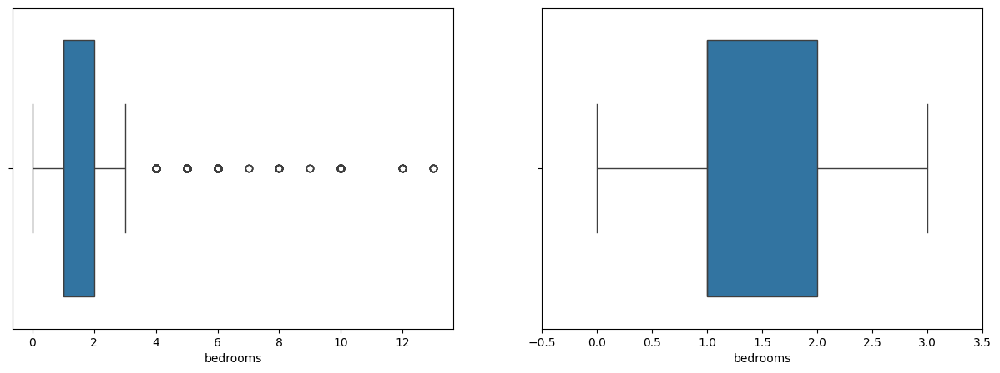

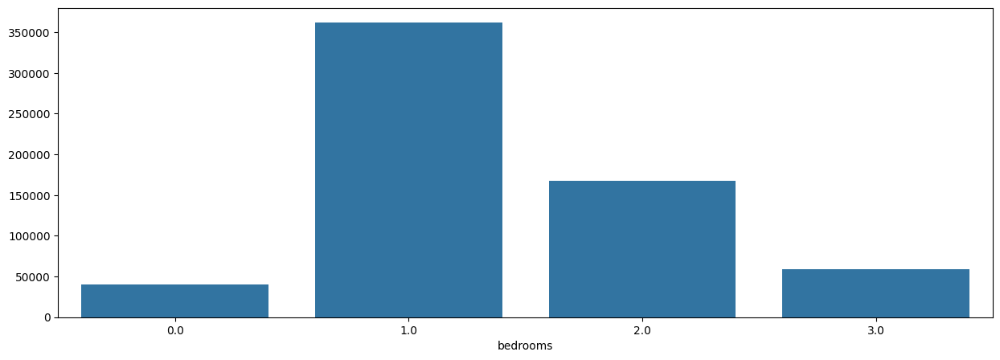

In [26]:
print(limites(base_airbnb['bedrooms']))
diagrama_caixa(base_airbnb['bedrooms'])
grafico_barra(base_airbnb['bedrooms'])

In [27]:
base_airbnb, linhas_removidas = excluir_outliers(base_airbnb, 'bedrooms')
print('{} linhas removidas.'.format(linhas_removidas))

5482 linhas removidas.


### Análise 'beds' 

(np.float64(-2.0), np.float64(6.0))


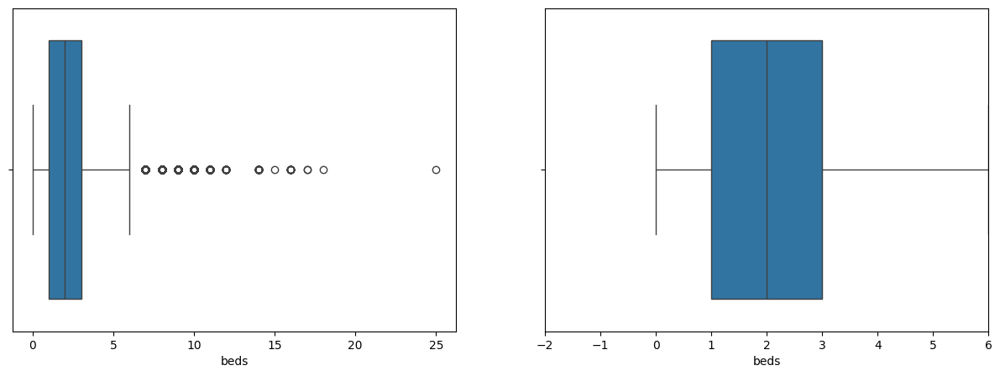

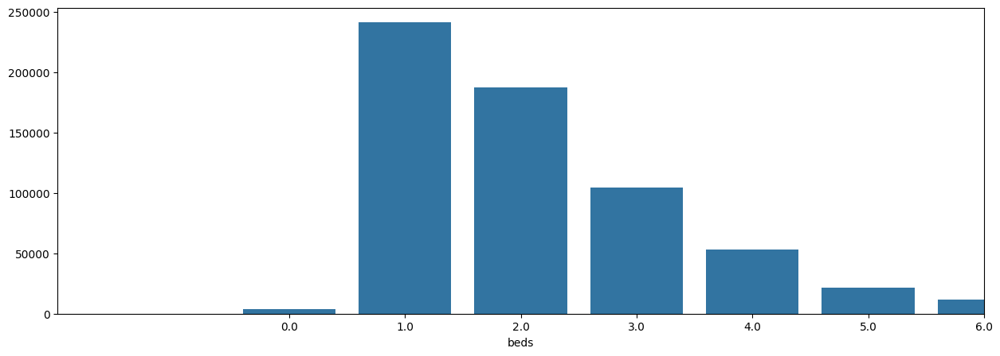

In [28]:
print(limites(base_airbnb['beds']))
diagrama_caixa(base_airbnb['beds'])
grafico_barra(base_airbnb['beds'])

In [29]:
base_airbnb, linhas_removidas = excluir_outliers(base_airbnb, 'beds')
print('{} linhas removidas.'.format(linhas_removidas))

5622 linhas removidas.


### Análise 'guests_included'

(np.float64(1.0), np.float64(1.0))


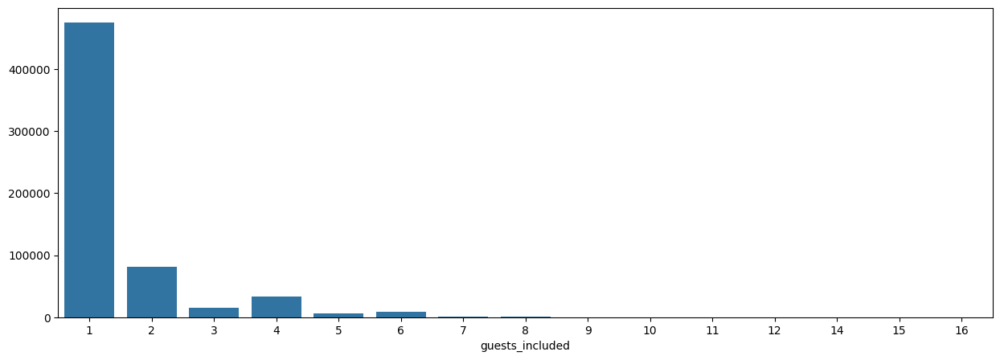

In [30]:
print(limites(base_airbnb['guests_included']))
plt.figure(figsize=(15, 5))
contagem = base_airbnb['guests_included'].value_counts()
ax = sns.barplot(x=contagem.index, y=contagem.values)

In [31]:
base_airbnb = base_airbnb.drop('guests_included', axis=1)
base_airbnb.shape

(622366, 22)

### Análise 'minimum_nights'

(np.float64(-3.5), np.float64(8.5))


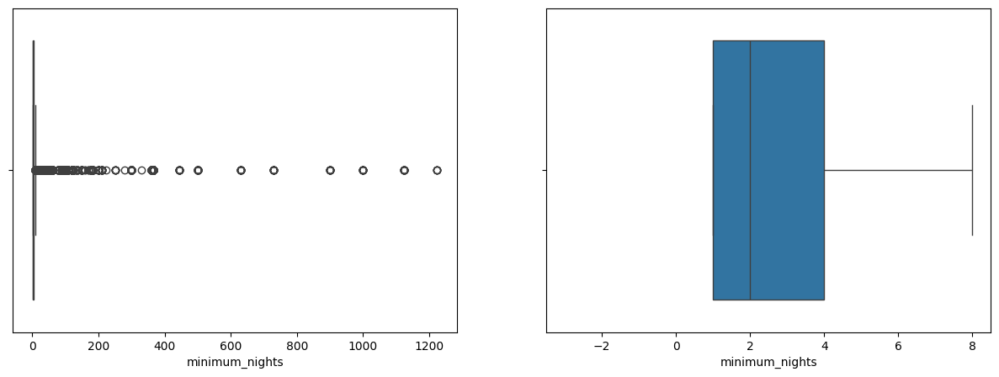

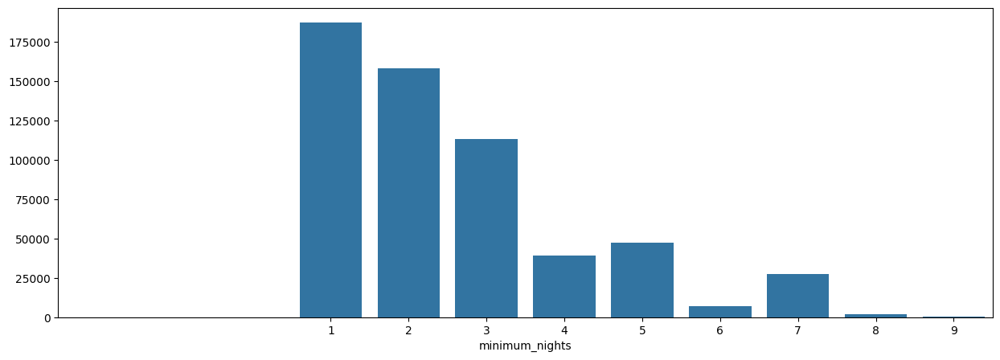

In [32]:
print(limites(base_airbnb['minimum_nights']))
diagrama_caixa(base_airbnb['minimum_nights'])
grafico_barra(base_airbnb['minimum_nights'])

In [33]:
base_airbnb, linhas_removidas = excluir_outliers(base_airbnb, 'minimum_nights')
print('{} linhas removidas.'.format(linhas_removidas))

40383 linhas removidas.


### Análise 'number_of_reviews'

(np.float64(-9.0), np.float64(15.0))


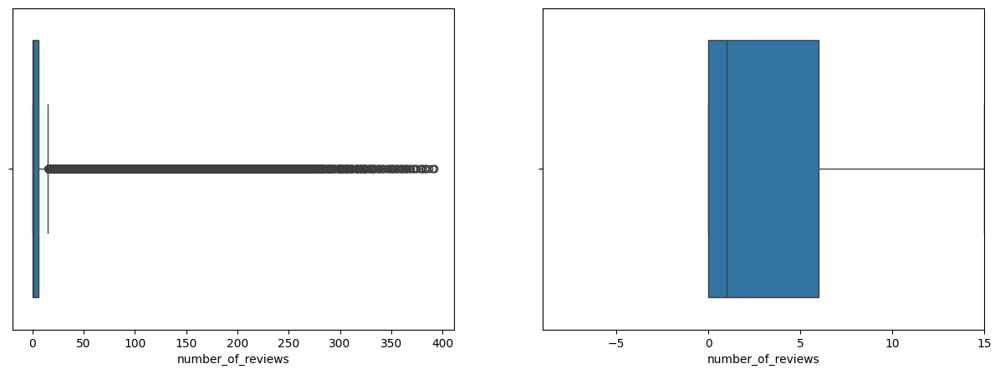

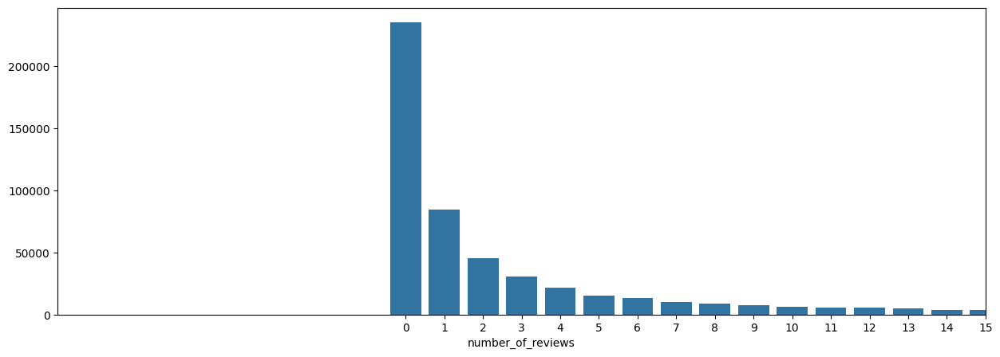

In [34]:
print(limites(base_airbnb['number_of_reviews']))
diagrama_caixa(base_airbnb['number_of_reviews'])
grafico_barra(base_airbnb['number_of_reviews'])

In [35]:
base_airbnb = base_airbnb.drop('number_of_reviews', axis=1)
base_airbnb.shape

(581983, 21)

### Tratamento de Colunas de Valor TEXTO

- Vamos tratar as colunas verificando quais estão com disparidade na contagem dos valores, para decidir se vamos agrupar ou não em uma nova categoria.

### Análise - property_type

property_type
Apartment                 458354
House                      51387
Condominium                26456
Serviced apartment         12671
Loft                       12352
Guest suite                 3621
Bed and breakfast           3472
Hostel                      2665
Guesthouse                  2155
Other                       1957
Villa                       1294
Townhouse                    969
Aparthotel                   693
Chalet                       481
Earth house                  468
Tiny house                   457
Boutique hotel               447
Hotel                        376
Casa particular (Cuba)       298
Cottage                      230
Bungalow                     207
Dorm                         185
Cabin                        141
Nature lodge                 124
Castle                        80
Treehouse                     76
Island                        54
Boat                          53
Hut                           40
Campsite                     

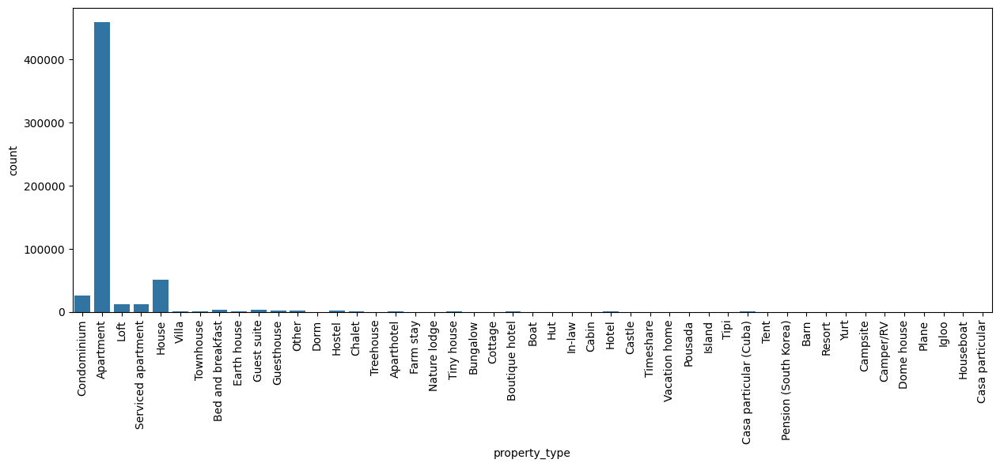

In [36]:
print(base_airbnb['property_type'].value_counts())
plt.figure(figsize=(15,5))
grafico_ptype = sns.countplot(x='property_type', data=base_airbnb)
grafico_ptype.tick_params(axis='x', rotation=90)

- Ao analisar a coluna property_type verificamos que valores abaixo da categoria 'Other' poderiam ser agrupados. Abaixo verificamos o novo display da coluna property_type já agrupada numa nova categoria chamada 'Outros'.

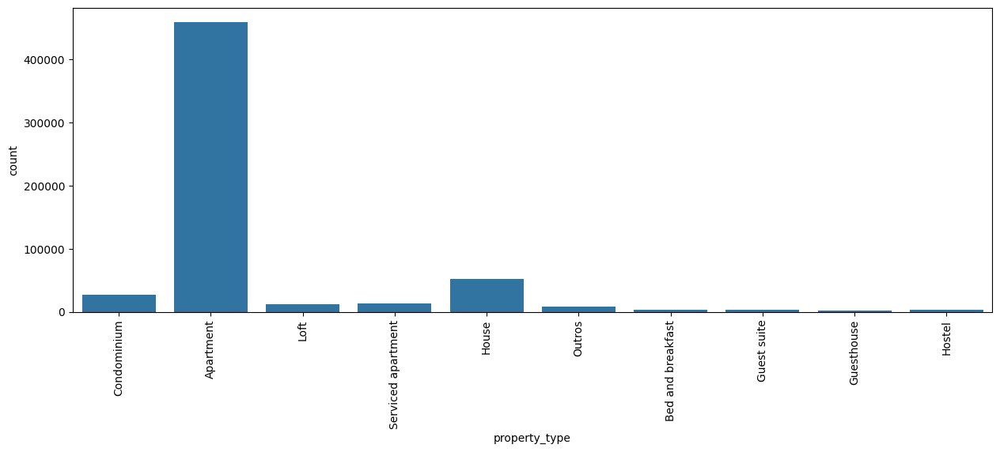

In [37]:
tabela_tipos_casa = base_airbnb['property_type'].value_counts()
colunas_agrupar = []

for tipo in tabela_tipos_casa.index:
    if tabela_tipos_casa[tipo] < 2000:
        colunas_agrupar.append(tipo)

for tipo in colunas_agrupar:
    base_airbnb.loc[base_airbnb['property_type']==tipo, 'property_type'] = 'Outros'

plt.figure(figsize=(15,5))
grafico_ptype = sns.countplot(x='property_type', data=base_airbnb)
grafico_ptype.tick_params(axis='x', rotation=90)

### Análise - room_type

room_type
Entire home/apt    372443
Private room       196859
Shared room         11714
Hotel room            967
Name: count, dtype: int64


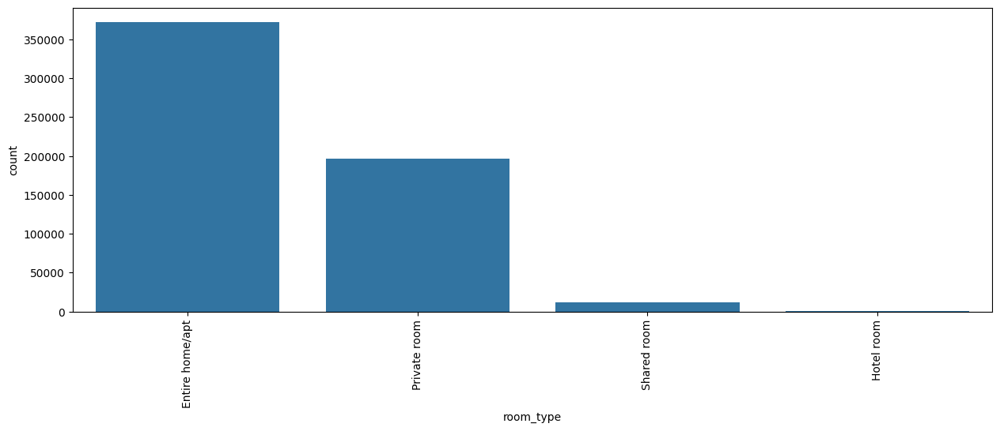

In [38]:
print(base_airbnb['room_type'].value_counts())
plt.figure(figsize=(15,5))
grafico_ptype = sns.countplot(x='room_type', data=base_airbnb)
grafico_ptype.tick_params(axis='x', rotation=90)

- Temos uma certa disparidade na coluna room_type porém com poucas categorias, nesse caso vou manter do jeito que está.

bed_type

bed_type
Real Bed         570643
Pull-out Sofa      8055
Futon              1634
Airbed             1155
Couch               496
Name: count, dtype: int64


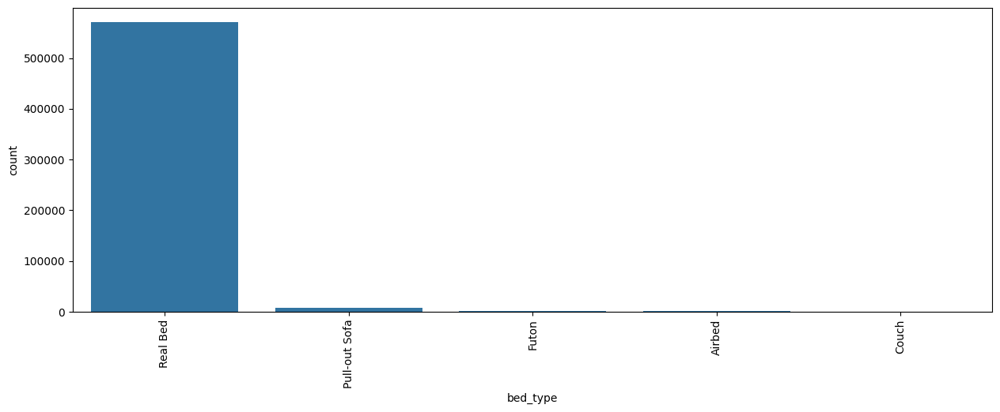

In [39]:
print(base_airbnb['bed_type'].value_counts())
plt.figure(figsize=(15,5))
grafico_ptype = sns.countplot(x='bed_type', data=base_airbnb)
grafico_ptype.tick_params(axis='x', rotation=90)

Na coluna bed_type, observamos que uma das categorias apresenta um valor significativamente maior em comparação com as demais. Apesar de existirem apenas cinco categorias, agruparemos todas, exceto a categoria 'Real Bed', criando assim uma classificação binária: 'Real Bed' e 'Outras'.

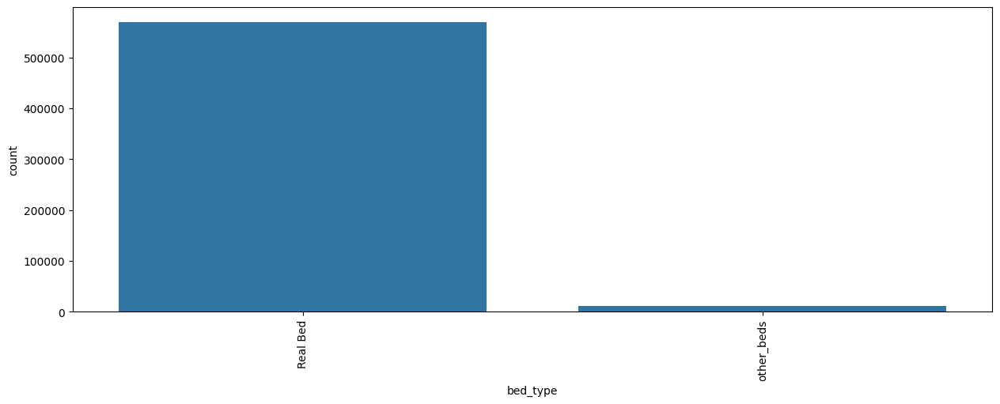

In [40]:
tabela_tipos_cama = base_airbnb['bed_type'].value_counts()
colunas_agrupar = []

for tipo in tabela_tipos_cama.index:
    if tabela_tipos_cama[tipo] < 9000:
        colunas_agrupar.append(tipo)

for tipo in colunas_agrupar:
    base_airbnb.loc[base_airbnb['bed_type']==tipo, 'bed_type'] = 'other_beds'

plt.figure(figsize=(15,5))
grafico_btype = sns.countplot(x='bed_type', data=base_airbnb)
grafico_btype.tick_params(axis='x', rotation=90)

## Anáise cancellation_policy

cancellation_policy
flexible                       258096
strict_14_with_grace_period    200743
moderate                       113281
strict                           9696
super_strict_60                   135
super_strict_30                    32
Name: count, dtype: int64


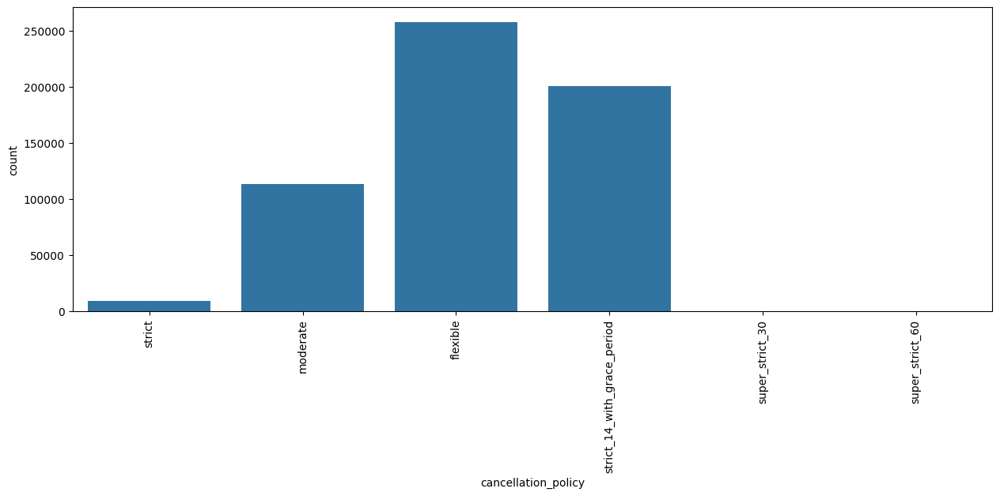

In [41]:
print(base_airbnb['cancellation_policy'].value_counts())
plt.figure(figsize=(15,5))
grafico_ptype = sns.countplot(x='cancellation_policy', data=base_airbnb)
grafico_ptype.tick_params(axis='x', rotation=90)

- Vamos juntar as três menores categorias em apenas uma, somando as categorias 'strict', 'super_stritc_30' e super_strict_60 em apenas 'other_strict'.

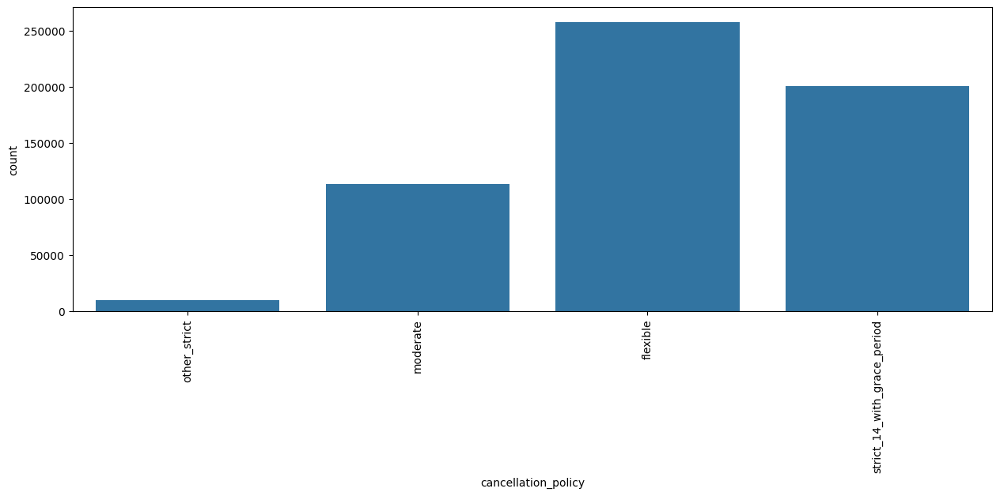

In [42]:
tabela_tipos_cancellation = base_airbnb['cancellation_policy'].value_counts()
colunas_agrupar = []

for tipo in tabela_tipos_cancellation.index:
    if tabela_tipos_cancellation[tipo] < 10000:
        colunas_agrupar.append(tipo)

for tipo in colunas_agrupar:
    base_airbnb.loc[base_airbnb['cancellation_policy']==tipo, 'cancellation_policy'] = 'other_strict'

plt.figure(figsize=(15,5))
grafico_btype = sns.countplot(x='cancellation_policy', data=base_airbnb)
grafico_btype.tick_params(axis='x', rotation=90)

### Análise amenities

In [43]:
print((base_airbnb['amenities'].iloc[1]).split(','))
print(len((base_airbnb['amenities'].iloc[1]).split(',')))

['{TV', '"Cable TV"', 'Internet', 'Wifi', '"Air conditioning"', 'Kitchen', 'Doorman', 'Elevator', '"Buzzer/wireless intercom"', '"Family/kid friendly"', 'Hangers', '"Hair dryer"', 'Iron', '"Laptop friendly workspace"}']
14


- Como nossos resultados são uma lista de valores e fica inviavel de analisar esses valores pois as mesmas amenities podem ser descritas de formas diferentes, vamos avaliar a quantidade de amenities como o parâmetro para o nosso modelo.

- Vamos adicionar a coluna n_amenities e deletar a antiga coluna amenities.

In [44]:
base_airbnb['n_amenities'] = base_airbnb['amenities'].str.split(',').apply(len)
base_airbnb = base_airbnb.drop('amenities', axis=1)
base_airbnb.shape

(581983, 21)

- Como transformamos a coluna amenities em n_amenities, virou uma coluna numerica, vamos ter que aplicar os nossos gráficos e analisar se precisamos deletar outliers.

(np.float64(-5.5), np.float64(38.5))


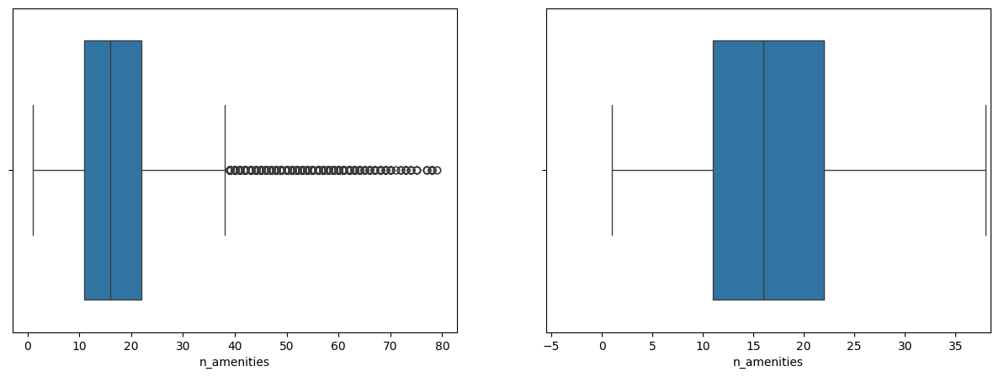

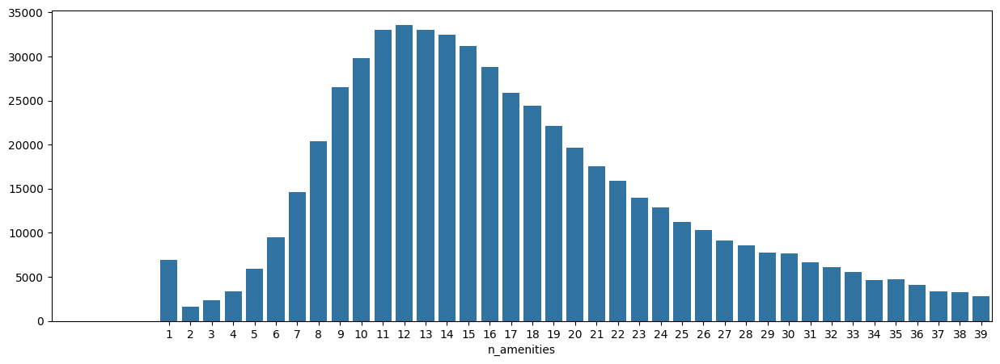

In [45]:
print(limites(base_airbnb['n_amenities']))
diagrama_caixa(base_airbnb['n_amenities'])
grafico_barra(base_airbnb['n_amenities'])

- Analisando os resultados, iremos deletar os outliers.

In [46]:
base_airbnb, linhas_removidas = excluir_outliers(base_airbnb, 'n_amenities')
print('{} linhas removidas.'.format(linhas_removidas))

24343 linhas removidas.


### Para as duas colunas faltantes, latitude e longitude, vamos fazer um mapa de terreno das propriedades usando o valor price como Z.

- Vamos usar uma amostra de 50.000 mil valores para termos melhor visualização e mais precisão.

In [47]:
amostra = base_airbnb.sample(n=50000)
centro_mapa = {'lat': amostra.latitude.mean(), 'lon': amostra.longitude.mean()}
mapbox_token = "pk.eyJ1Ijoia2FhdWFuY2lwdWxsbyIsImEiOiJjbTNvc3VzazIwNmlwMnJvcnE5YjN1ZTQ1In0.54cZRdhwusJaZHbm1Qnkqw"
px.set_mapbox_access_token(mapbox_token)
fig = px.density_mapbox(amostra, lat='latitude', lon='longitude', z='price', radius=2.5, center=centro_mapa, zoom=10, mapbox_style='stamen-terrain')
fig.show()

### Encoding

Precisamos ajustar as Features em valores binários para facilitar o trabalho do modelo de previsão (features de categoria, true/false, etc.)

- Features de Valores True or False, vamos substituir True por 1 e False por 0.

- Features de Categoria (features em que os valores da coluna são textos), vamos utilizar o método de encoding de variáveis dummies. (Assegurando que não criemos ordinalidade sem intenção podendo atrapalhar nosso modelo.)

In [48]:
print(base_airbnb.columns)

Index(['host_is_superhost', 'host_listings_count', 'host_identity_verified',
       'latitude', 'longitude', 'property_type', 'room_type', 'accommodates',
       'bathrooms', 'bedrooms', 'beds', 'bed_type', 'price', 'extra_people',
       'minimum_nights', 'instant_bookable', 'is_business_travel_ready',
       'cancellation_policy', 'ano', 'mes', 'n_amenities'],
      dtype='object')


In [49]:
colunas_tf = ['host_is_superhost', 'instant_bookable', 'is_business_travel_ready', 'host_identity_verified']
base_airbnb_encoding = base_airbnb.copy()

for coluna in colunas_tf:
    base_airbnb_encoding.loc[base_airbnb_encoding[coluna]=="t", coluna] = 1
    base_airbnb_encoding.loc[base_airbnb_encoding[coluna]=="f", coluna] = 0

In [50]:
colunas_categorias = ['property_type', 'room_type', 'bed_type', 'cancellation_policy']
base_airbnb_encoding = pd.get_dummies(base_airbnb_encoding, columns=colunas_categorias, dtype=int)

In [51]:
display(base_airbnb_encoding)

,host_is_superhost,host_listings_count,host_identity_verified,latitude,longitude,accommodates,bathrooms,bedrooms,beds,price,...,room_type_Entire home/apt,room_type_Hotel room,room_type_Private room,room_type_Shared room,bed_type_Real Bed,bed_type_other_beds,cancellation_policy_flexible,cancellation_policy_moderate,cancellation_policy_other_strict,cancellation_policy_strict_14_with_grace_period
1,1,2.0,0,-22.965919,-43.178963,5,1.0,2.0,2.0,270.0,...,1,0,0,0,1,0,0,0,1,0
3,0,3.0,1,-22.977118,-43.190453,3,1.0,1.0,2.0,161.0,...,1,0,0,0,1,0,0,0,1,0
4,1,1.0,1,-22.983025,-43.214272,3,1.0,1.0,2.0,222.0,...,1,0,0,0,1,0,0,0,1,0
5,1,1.0,1,-22.988165,-43.193588,3,1.5,1.0,2.0,308.0,...,1,0,0,0,1,0,0,0,1,0
6,1,1.0,1,-22.981270,-43.190456,2,1.0,1.0,2.0,219.0,...,1,0,0,0,1,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
902204,0,1.0,0,-22.986031,-43.191662,4,2.0,2.0,3.0,250.0,...,1,0,0,0,1,0,1,0,0,0
902205,0,0.0,0,-23.003180,-43.342838,4,1.0,0.0,2.0,121.0,...,1,0,0,0,1,0,1,0,0,0
902206,0,0.0,0,-22.966640,-43.393452,4,2.0,2.0,3.0,799.0,...,1,0,0,0,1,0,1,0,0,0
902208,0,0.0,1,-23.003401,-43.341820,4,1.0,1.0,1.0,250.0,...,1,0,0,0,1,0,0,0,0,1


### Modelo de Previsão

- Métricas de Avaliação
    - Utilizando a biblioteca SKLEARN, vamos usar duas métricas para análise dos modelos, que são r² e RSME (Erro Quadrático Médio)
    - Iremos definir uma função para análisar os dois casos
    - Precisamos que o valor r² seja o mais perto possível de 100% e o valor de RSME o menor póssivel, sendo o r² a métrica principal.

In [52]:
def avaliar_modelo(nome_modelo, y_teste, previsao):
    r2 = r2_score(y_teste, previsao)
    RSME = np.sqrt(mean_squared_error(y_teste, previsao))
    return f"Modelo {nome_modelo}:\nR²:{r2:.2%}\nRSME:{RSME:.2f}"

- Agora vamos escolher três modelos de previsão a serem testados.
    - Modelos de Árvore de Decisão
      - Random Forest
      - Extra Tree
        
    - Modelo de Regressão Linear

         - LinearRegression

In [53]:
modelo_rf = RandomForestRegressor()
modelo_et = ExtraTreesRegressor()
modelo_lr = LinearRegression()

modelos = {
    'RandomForest': modelo_rf,
    'Extratrees': modelo_et,
    'LinearRegression': modelo_lr,
}

- Aqui irei separar as váriaveis em X e Y, que são basicamente X sendo nossa base inteira menos a coluna 'price' e Y sendo apenas a coluna 'price'

In [54]:
y = base_airbnb_encoding['price']
X = base_airbnb_encoding.drop('price', axis=1)

- Vamos separar os dados em aprendizado e teste para treinar o nosso modelo de previsão
    - O ideial seria fazer no mesmo FOR o aprendizado e teste porém como o processo de aprendizado demora irei separar para ensinar apenas uma vez e testar quantas precisar.

In [55]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=10)

for nome_modelo, modelo in modelos.items():
    #treinar
    modelo.fit(X_train, y_train)

In [56]:
for nome_modelo, modelo in modelos.items():
    #testar
    previsao = modelo.predict(X_test)
    print(avaliar_modelo(nome_modelo, y_test, previsao))

Modelo RandomForest:
R²:97.24%
RSME:44.07
Modelo Extratrees:
R²:97.53%
RSME:41.69
Modelo LinearRegression:
R²:32.81%
RSME:217.36


- Modelo escolhido como melhor modelo: Extra Trees Regressor

Esse modelo foi o que teve o maior r² e ao mesmo tempo o menor valor de RSME. Como a velocidade do script de treino e previsão foram bem parecidos vamos manter o melhor.

### Análise do Melhor Modelo

- Vamos analisar melhor agora as nossas features, calculando o peso que cada uma tem na análise do nosso modelo de previsão

In [57]:
importancia_features = pd.DataFrame(modelo_et.feature_importances_, X_train.columns).sort_values(by=0, ascending=False)
display(importancia_features)

,0
bedrooms,0.118824
latitude,0.098299
longitude,0.096079
extra_people,0.087079
n_amenities,0.083667
accommodates,0.073035
bathrooms,0.071249
minimum_nights,0.064177
room_type_Entire home/apt,0.057707
beds,0.051401


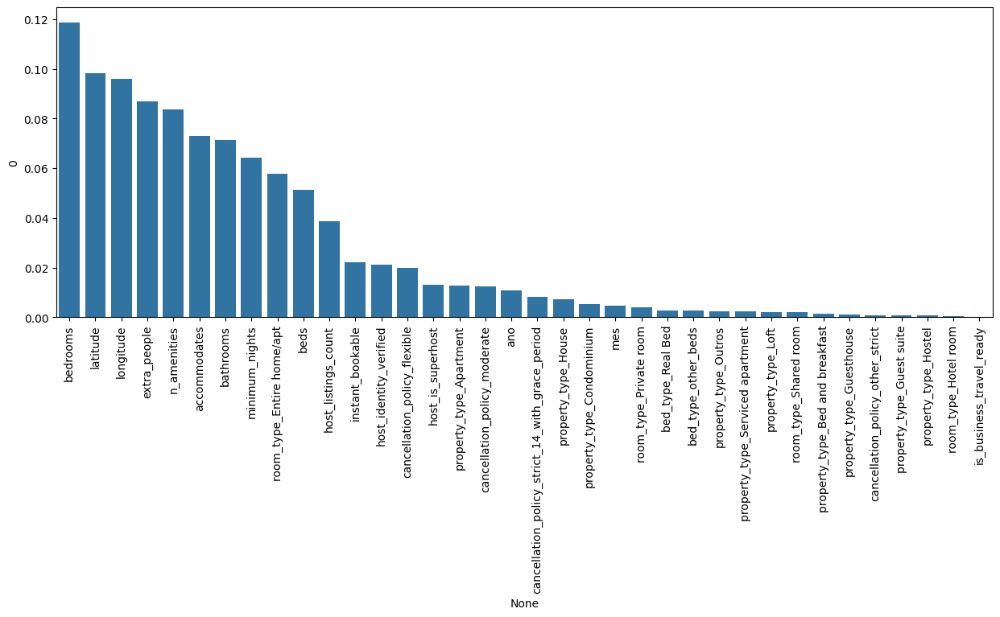

In [58]:
plt.figure(figsize=(15,5))
grafico_importancia_features = sns.barplot(x=importancia_features.index, y=importancia_features[0])
grafico_importancia_features.tick_params(axis='x', rotation=90)

### Ajustes Finais no Modelo

- a feature is_business_travel_ready não parece ter impacto no nosso modelo, portanto, para simplificar o modelo tendo como objetivo um script mais limpo e rápido, vamos excluir a feature e testar o modelo sem ela.

In [59]:
base_airbnb_encoding = base_airbnb_encoding.drop('is_business_travel_ready', axis=1)

y = base_airbnb_encoding['price']
X = base_airbnb_encoding.drop('price', axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=10)

modelo_et.fit(X_train, y_train)
previsao = modelo_et.predict(X_test)
print(avaliar_modelo("ExtraTrees", y_test, previsao))

Modelo ExtraTrees:
R²:97.54%
RSME:41.62


- Nos números de métrica não mudou nada porém retirando essa feature sem alterar as métricas significa uma melhoria, o ideal é que melhorasse a métrica porém o nosso modelo de previsão já tem ótimos resultados.

### Ainda mais Ajustes e Melhorias no Melhor Modelo

- Vamos testar retirar mais duas colunas que parecem não ter muito impacto e treinar novamente o nosso modelo.
    - Vamos retirar as features 'bed_type_Real_Bed' e 'bed_type_other_beds'
    - Irei criar uma base reserva para teste para não perder os resultados originais e ter que rodar o script inteiro.


In [60]:
base_teste = base_airbnb_encoding.copy()
for coluna in base_teste:
    if 'bed_type' in coluna:       
        base_teste = base_teste.drop(coluna, axis=1)
print(base_teste.columns)

y = base_teste['price']
X = base_teste.drop('price', axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=10)

modelo_et.fit(X_train, y_train)
previsao = modelo_et.predict(X_test)
print(avaliar_modelo("ExtraTrees", y_test, previsao))

Index(['host_is_superhost', 'host_listings_count', 'host_identity_verified',
       'latitude', 'longitude', 'accommodates', 'bathrooms', 'bedrooms',
       'beds', 'price', 'extra_people', 'minimum_nights', 'instant_bookable',
       'ano', 'mes', 'n_amenities', 'property_type_Apartment',
       'property_type_Bed and breakfast', 'property_type_Condominium',
       'property_type_Guest suite', 'property_type_Guesthouse',
       'property_type_Hostel', 'property_type_House', 'property_type_Loft',
       'property_type_Outros', 'property_type_Serviced apartment',
       'room_type_Entire home/apt', 'room_type_Hotel room',
       'room_type_Private room', 'room_type_Shared room',
       'cancellation_policy_flexible', 'cancellation_policy_moderate',
       'cancellation_policy_other_strict',
       'cancellation_policy_strict_14_with_grace_period'],
      dtype='object')
Modelo ExtraTrees:
R²:97.51%
RSME:41.86


- Verificamos que retirar a feature bed_type favoreceu nosso projeto, tivemos uma pequena melhoria no RSME mesmo sem duas colunas, o que é muito bom, mantendo o valor do r².

Acredito que ainda possamos fazer algumas melhorias no nosso modelo, poderiamos sim verificar outrar features ou outliers para ajustes porém acredito que temos um ótimo resultado para o que foi proposto.

### DEPLOY DO PROJETO

- Deploy do Projeto
    - Passo 1 -> Criar arquivo do Modelo (joblib)
    - Passo 2 -> Deploy apenas para uso direto Streamlit<br>
  - Passo 3 -> Outro arquivo Python (pode ser Jupyter ou PyCharm)
  - Passo 4 -> Importar streamlit e criar código
  - Passo 5 -> Atribuir ao botão o carregamento do modelo
  - Passo 6 -> Deploy feito

In [61]:
X['price'] = y
X.to_csv('dados.csv')

In [62]:
import joblib
joblib.dump(modelo_et, 'modelo.joblib')

['modelo.joblib']